In [647]:
#importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import statistics
import seaborn as sns
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor  
from sklearn.linear_model import LinearRegression
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

In [648]:
#importing dataset
pd.set_option('display.max_columns', 500)
hotel_reservations_df = pd.read_csv('data/Hotel Reservations.csv')

In [649]:
### EDA STARTS HERE ###

In [650]:
#view first 10 rows of df
hotel_reservations_df.head(10)

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled
5,INN00006,2,0,0,2,Meal Plan 2,0,Room_Type 1,346,2018,9,13,Online,0,0,0,115.00,1,Canceled
6,INN00007,2,0,1,3,Meal Plan 1,0,Room_Type 1,34,2017,10,15,Online,0,0,0,107.55,1,Not_Canceled
7,INN00008,2,0,1,3,Meal Plan 1,0,Room_Type 4,83,2018,12,26,Online,0,0,0,105.61,1,Not_Canceled
8,INN00009,3,0,0,4,Meal Plan 1,0,Room_Type 1,121,2018,7,6,Offline,0,0,0,96.90,1,Not_Canceled
9,INN00010,2,0,0,5,Meal Plan 1,0,Room_Type 4,44,2018,10,18,Online,0,0,0,133.44,3,Not_Canceled


In [651]:
#view last 10 rows of df
hotel_reservations_df.tail(10)

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
36265,INN36266,2,0,1,3,Meal Plan 1,0,Room_Type 1,15,2018,5,30,Online,0,0,0,100.73,0,Not_Canceled
36266,INN36267,2,0,2,2,Meal Plan 1,0,Room_Type 2,8,2018,3,4,Online,0,0,0,85.96,1,Canceled
36267,INN36268,2,0,1,0,Not Selected,0,Room_Type 1,49,2018,7,11,Online,0,0,0,93.15,0,Canceled
36268,INN36269,1,0,0,3,Meal Plan 1,0,Room_Type 1,166,2018,11,1,Offline,0,0,0,110.00,0,Canceled
36269,INN36270,2,2,0,1,Meal Plan 1,0,Room_Type 6,0,2018,10,6,Online,0,0,0,216.00,0,Canceled
36270,INN36271,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled
36271,INN36272,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled
36272,INN36273,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled
36273,INN36274,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled
36274,INN36275,2,0,1,2,Meal Plan 1,0,Room_Type 1,207,2018,12,30,Offline,0,0,0,161.67,0,Not_Canceled


In [652]:
#see names of all data columns in df
hotel_reservations_df.columns

Index(['Booking_ID', 'no_of_adults', 'no_of_children', 'no_of_weekend_nights',
       'no_of_week_nights', 'type_of_meal_plan', 'required_car_parking_space',
       'room_type_reserved', 'lead_time', 'arrival_year', 'arrival_month',
       'arrival_date', 'market_segment_type', 'repeated_guest',
       'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled',
       'avg_price_per_room', 'no_of_special_requests', 'booking_status'],
      dtype='object')

In [653]:
#check size of df
hotel_reservations_df.shape

(36275, 19)

In [654]:
#see statistical summary of columns in df
hotel_reservations_df.describe().T

,count,mean,std,min,25%,50%,75%,max
no_of_adults,36275.0,1.844962,0.518715,0.0,2.0,2.00,2.0,4.0
no_of_children,36275.0,0.105279,0.402648,0.0,0.0,0.00,0.0,10.0
no_of_weekend_nights,36275.0,0.810724,0.870644,0.0,0.0,1.00,2.0,7.0
no_of_week_nights,36275.0,2.204300,1.410905,0.0,1.0,2.00,3.0,17.0
required_car_parking_space,36275.0,0.030986,0.173281,0.0,0.0,0.00,0.0,1.0
lead_time,36275.0,85.232557,85.930817,0.0,17.0,57.00,126.0,443.0
arrival_year,36275.0,2017.820427,0.383836,2017.0,2018.0,2018.00,2018.0,2018.0
arrival_month,36275.0,7.423653,3.069894,1.0,5.0,8.00,10.0,12.0
arrival_date,36275.0,15.596995,8.740447,1.0,8.0,16.00,23.0,31.0
repeated_guest,36275.0,0.025637,0.158053,0.0,0.0,0.00,0.0,1.0


In [655]:
#check datatype of column and for any missing data
hotel_reservations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

In [656]:
#Select all numerical data
num_cols = hotel_reservations_df.select_dtypes(exclude='object')

#Select all non-numerical data
cat_cols = hotel_reservations_df.select_dtypes(include='object')

In [657]:
#Univariate Analysis

In [658]:
#check booking status distribution to see how common are cancellations
fig = px.histogram(hotel_reservations_df, 
                   x='booking_status', 
                   color='booking_status', 
                   title='Booking Status Distribution',
                   labels={'booking_status': 'Booking Status'})

fig.show()

In [659]:
#check count for room_type_reserved to determine room popularity
fig = px.histogram(hotel_reservations_df, 
                   x='room_type_reserved', 
                   color='room_type_reserved', 
                   title='Room Type Reserved Distribution',
                   labels={'room_type_reserved': 'Room Type Reserved'})

fig.show()

In [660]:
#check count for market_segment_type to identify booking channel popularity

fig = px.pie(hotel_reservations_df, 
             names='market_segment_type',  # Column for segment labels
             title='Market Segment Breakdown')

fig.update_traces(textinfo='percent+label', textposition='inside')
fig.show()


In [661]:
#check lead time to see how far in advance reservations are made
fig = px.histogram(hotel_reservations_df, 
                   x='lead_time',  
                   title='Lead Time Distribution (KDE Line Overlay)', 
                   nbins=30,  
                   marginal='violin',)

fig.show()


In [662]:
#check no_of_special_requests to see how common are special requests
fig = px.histogram(hotel_reservations_df, 
                   x='no_of_special_requests', 
                   color='no_of_special_requests', 
                   title='Number of Special Requests',
                   labels={'no_of_special_requests': 'Special Requests'})

fig.show()

In [663]:
#Bivariate Analysis

In [664]:
#check correlation between features in df
corr = num_cols.corr()

#creating a heat map of all the numerical features
fig = px.imshow(corr)
fig.update_xaxes(side="top")

# Adjust the size of the heatmap
fig.update_layout(
    width=1000,  # Adjust the width
    height=800   # Adjust the height
)
fig.show()

In [665]:
#moderate correlations - 
#no_of_previous_cancellations , repeated_guest (0.391)
#no_of_previous_bookings_not_canceled , repeated_guest (0.539)
#no_of_previous_bookings_not_canceled , no_of_previous_cancellations (0.468)

In [666]:
#compare avg_price_per_room vs bookings_status and see if there are outliers
fig = px.box(hotel_reservations_df,
             x="booking_status",
             y="avg_price_per_room",
             color = "booking_status",
             title='Average Room Price vs Booking Status'

)
fig.show()

In [667]:
#Compare lead_time distribution vs bookings_status
fig = px.box(hotel_reservations_df, 
             x='booking_status', 
             y='lead_time', 
             color='booking_status', 
             title='Lead Time Distribution by Booking Status')

fig.show()

In [668]:
#canceled bookings generally have longer lead times

In [669]:
#Compare room_type_reserved vs bookings_status
fig = px.histogram(hotel_reservations_df, 
             x='room_type_reserved', 
             color='booking_status', 
             title='Room Type vs. Booking Status',
             barmode='group')

fig.show()

In [670]:
#Room type 6 has the highest cancellation rate

In [671]:
#Compare type_of_meal_plan vs bookings_status
fig = px.histogram(hotel_reservations_df, 
             x='type_of_meal_plan', 
             color='booking_status', 
             title='Meal Plan vs. Booking Status',
             barmode='relative')

fig.show()

In [672]:
#reservations without any meal types selected were less likely to cancel

In [673]:
#check average no_of_special_requests vs booking status
avg_requests = hotel_reservations_df.groupby('booking_status', as_index=False)['no_of_special_requests'].mean()

fig = px.bar(avg_requests, 
             x='booking_status', 
             y='no_of_special_requests', 
             color='booking_status', 
             text_auto=True,
             title='Average Number of Special Requests (Canceled vs. Not Canceled)',
             labels={'no_of_special_requests': 'Avg. Special Requests', 'booking_status': 'Booking Status'})

fig.show()


In [674]:
#bookings with more special requests were less likely to be canceled

In [675]:
### Data Preprocessing & Feature Engineering ###

In [676]:
#One-Hot encoding for type_of_meal_plan, room_type_reserved, market_segment_type
hotel_reservations_df = pd.get_dummies(hotel_reservations_df, columns=['type_of_meal_plan', 'room_type_reserved', 'market_segment_type'], drop_first=True)

In [677]:
#drop Booking_ID
hotel_reservations_df.drop(['Booking_ID'], axis='columns', inplace=True)
hotel_reservations_df.head()

#drop arrival_year
hotel_reservations_df.drop(['arrival_year'], axis='columns', inplace=True)
hotel_reservations_df.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,type_of_meal_plan_Meal Plan 2,type_of_meal_plan_Meal Plan 3,type_of_meal_plan_Not Selected,room_type_reserved_Room_Type 2,room_type_reserved_Room_Type 3,room_type_reserved_Room_Type 4,room_type_reserved_Room_Type 5,room_type_reserved_Room_Type 6,room_type_reserved_Room_Type 7,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online
0,2,0,1,2,0,224,10,2,0,0,0,65.00,0,Not_Canceled,0,0,0,0,0,0,0,0,0,0,0,1,0
1,2,0,2,3,0,5,11,6,0,0,0,106.68,1,Not_Canceled,0,0,1,0,0,0,0,0,0,0,0,0,1
2,1,0,2,1,0,1,2,28,0,0,0,60.00,0,Canceled,0,0,0,0,0,0,0,0,0,0,0,0,1
3,2,0,0,2,0,211,5,20,0,0,0,100.00,0,Canceled,0,0,0,0,0,0,0,0,0,0,0,0,1
4,2,0,1,1,0,48,4,11,0,0,0,94.50,0,Canceled,0,0,1,0,0,0,0,0,0,0,0,0,1


In [678]:
#label encode booking_status

#create a LabelEncoder object
label_encoder = LabelEncoder()

hotel_reservations_df['booking_status'] = label_encoder.fit_transform(hotel_reservations_df['booking_status'])
hotel_reservations_df.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,type_of_meal_plan_Meal Plan 2,type_of_meal_plan_Meal Plan 3,type_of_meal_plan_Not Selected,room_type_reserved_Room_Type 2,room_type_reserved_Room_Type 3,room_type_reserved_Room_Type 4,room_type_reserved_Room_Type 5,room_type_reserved_Room_Type 6,room_type_reserved_Room_Type 7,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online
0,2,0,1,2,0,224,10,2,0,0,0,65.00,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1,2,0,2,3,0,5,11,6,0,0,0,106.68,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1
2,1,0,2,1,0,1,2,28,0,0,0,60.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,2,0,0,2,0,211,5,20,0,0,0,100.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,2,0,1,1,0,48,4,11,0,0,0,94.50,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


In [679]:
#create new total_nights column
hotel_reservations_df['total_nights'] = hotel_reservations_df['no_of_weekend_nights'] + hotel_reservations_df['no_of_week_nights']

#create new columns for reservations that are weekdays/weekends only
#hotel_reservations_df['is_weekend_only'] = (hotel_reservations_df['no_of_weekend_nights'] > 0) & (hotel_reservations_df['no_of_week_nights'] == 0)
#hotel_reservations_df['is_weekday_only'] = (hotel_reservations_df['no_of_weekend_nights'] == 0) & (hotel_reservations_df['no_of_week_nights'] > 0)

#one hot encode new weekday/weekends only columns
#hotel_reservations_df = pd.get_dummies(hotel_reservations_df, columns=['is_weekend_only', 'is_weekday_only'], drop_first=True)

In [680]:
hotel_reservations_df.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,type_of_meal_plan_Meal Plan 2,type_of_meal_plan_Meal Plan 3,type_of_meal_plan_Not Selected,room_type_reserved_Room_Type 2,room_type_reserved_Room_Type 3,room_type_reserved_Room_Type 4,room_type_reserved_Room_Type 5,room_type_reserved_Room_Type 6,room_type_reserved_Room_Type 7,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online,total_nights
0,2,0,1,2,0,224,10,2,0,0,0,65.00,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,3
1,2,0,2,3,0,5,11,6,0,0,0,106.68,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,5
2,1,0,2,1,0,1,2,28,0,0,0,60.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3
3,2,0,0,2,0,211,5,20,0,0,0,100.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2
4,2,0,1,1,0,48,4,11,0,0,0,94.50,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,2


In [681]:
#check correlation between features in df again
num_cols = hotel_reservations_df.select_dtypes(exclude='object')
corr = num_cols.corr()

#creating a heat map of all the numerical features
fig = px.imshow(corr)
fig.update_xaxes(side="top")

# Adjust the size of the heatmap
fig.update_layout(
    width=1000,  # Adjust the width
    height=800   # Adjust the height
)
fig.show()

In [682]:
### Training the Model ###

In [683]:
#Split the data into training and test sets
X = hotel_reservations_df.drop(columns=['booking_status'])
y = hotel_reservations_df['booking_status']

#Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=5)

#Instantiate the model object
model = XGBClassifier(learning_rate=0.1, random_state=24, max_depth=18)

#Fit the model with the training data
model.fit(X_train, y_train)

#predict the target on the test dataset
y_predict = model.predict(X_test)
print('\nPrediction on test data', y_predict) 

#Calculate the Accuracy and F1 score
accuracy_test = metrics.accuracy_score(y_test, y_predict)
print('\nAccuracy_score on test dataset : ', accuracy_test)
f1 = f1_score(y_test, y_predict)
print("F1 Score: ", f1)


Prediction on test data [1 1 1 ... 1 1 1]

Accuracy_score on test dataset :  0.8991087016447671
F1 Score:  0.9262295081967213


In [684]:
#Split the data into training and test sets
X = hotel_reservations_df.drop(columns=['booking_status'])  # Features
y = hotel_reservations_df['booking_status']  # Target

#Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

#Instantiate the model object
rf_model = RandomForestClassifier(n_estimators=100, random_state=24)

#Fit the model with the training data
rf_model.fit(X_train, y_train)

#predict the target on the test dataset
y_predict = rf_model.predict(X_test)

#Calculate the Accuracy and F1 score
accuracy_test = metrics.accuracy_score(y_test, y_predict)
print('\nAccuracy_score on test dataset : ', accuracy_test)
f1 = f1_score(y_test, y_predict)
print("F1 Score: ", f1)



Accuracy_score on test dataset :  0.902049067352752
F1 Score:  0.9282927485537468


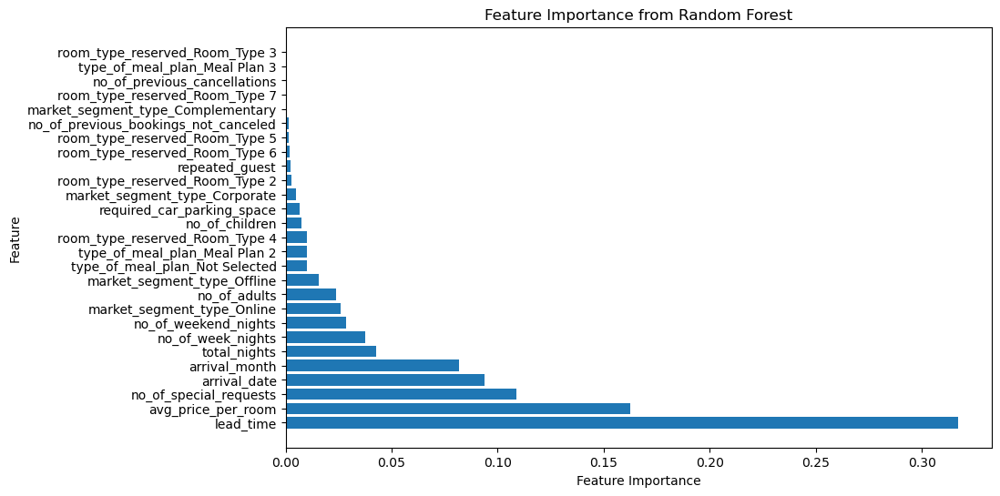

In [685]:
# Get feature importances
feature_importances = rf_model.feature_importances_

# Create a DataFrame for better visualization
feature_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
})
# Sort by importance
feature_df = feature_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_df['Feature'], feature_df['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance from Random Forest')
plt.show()